## Government Debt Around The World

In [2]:
import pandas as pd
import math
import numpy as np

import plotly.plotly as py
import plotly.graph_objs as go
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
cf.set_config_file(offline=True)

Gross Domestic Product (GDP) measures the total value of goods and services produced within a country. The ratio of a government's debt to the country's GDP makes it possible to compare relative debt levels across many different countries. A common question governments with high debt-to-GDP ratios often struggle to address (and usually deal with incorrectly) is whether to spend less in order to service its debt or to actually increase spending to boost economic growth, thus raising tax revenue. One of the most under-the-radar issues facing the global economy right now is the ever-rising national debt, brought about by the last global crisis and the aftermath thereof. While economic growth and record-low interest rates have made it easy to service existing government debt, it’s also created a situation where global government debt has grown to over $66 trillion. However, in the event of a recession or a rapid reversal of interest rates, debt levels could gain attention very quickly again, exacerbated by the potential for investors to lose faith in a country’s ability to ever repay its debt obligations.

Data Source: [International Monetary Fund](https://www.imf.org/external/datamapper/GGXWDG_NGDP@WEO/OEMDC/ADVEC/WEOWORLD/VEN). Data is up to date as of April 2019.

In [3]:
df = pd.read_csv('imf-debt-report.csv', encoding = "ISO-8859-1", na_values=['no data']).fillna('')
cols = df.columns.drop('General government gross debt (Percent of GDP)')
df[cols] = df[cols].apply(pd.to_numeric, errors='coerce')

df_latest = df[['General government gross debt (Percent of GDP)', '2019']]
df_latest = df_latest[:-33]

### Government Debt in 2019

- Japan has the largest amount of debt relative to its GDP, currently at 237.5%. Deflation has been Japan’s economic thorn in its side since the early 1990s. Asset bubbles from the post-WW2 era finally burst in 1989. The Japanese government and central bank supported financial organizations by bailing them out and providing low-interest credit. But this eventually became unsustainable, so banking institutions had to be consolidated and nationalized. Because of these & other government-approved actions, Japan’s debt level has skyrocketed.
- Next in line is Venezuela and then Sudan (more on these below).
- Eastern European countries have a lot less debt on their shoulders compared to Western Europe, except for Greece (174%). However, this is likely due to lower levels of economic growth.
- Portugal (119%) still struggles to kick its debt issues, while Ireland (62.5%) does relatively better after becoming the first crashed eurozone state to pull through.
- Overall, developed countries have the biggest debt problems.

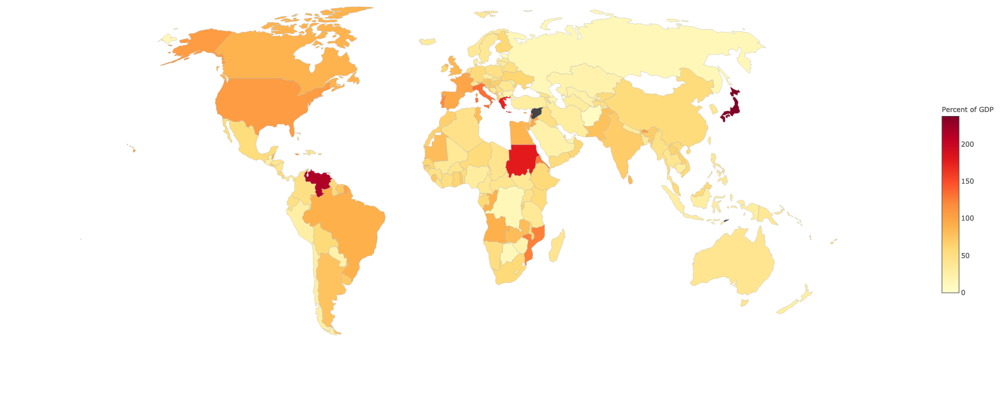

In [252]:
plotmap = [ dict(
        type = 'choropleth',
        locations = df_latest['General government gross debt (Percent of GDP)'],
        locationmode = 'country names',
        z = df_latest['2019'],
        text = df_latest['General government gross debt (Percent of GDP)'],
        colorscale = 'YlOrRd',
        reversescale = True,
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        colorbar =go.choropleth.ColorBar(
            title = 'Percent of GDP',
            len=0.5
        ),
      ) ]

layout = dict(
    margin={"t": 0, "b": 0, "l": 0, "r": 0},
    geo = dict(
        showframe = False,
        showcoastlines = False,
        projection = dict(
            type = 'natural earth'
        )
    ),
     height=700,
    width=900
)

fig = dict( data=plotmap, layout=layout )
iplot(fig)

### The Worst Offenders

- The Japanese economy, the third largest in the entire world, doesn’t produce nearly enough value in 2 years to pay off its debt.
- Sudan's story is probably the most interesting here. Record levels of debt back the 90s, the result of a decade's worth of internal conflicts and rebellions. The country managed to pay off a lot of that arrears in the early 21st century, before civil war broke out again, & South Sudan declared its independence in 2011. The US sanctions hardly help either. 
- Venezuela performs relatively well (due to its oil reserves) until 2017 when the country's economy collapsed, and has since been subject to rapid inflation, sanctions from abroad and lack of food and healthcare.
- The story of Greece (167.3%) and its struggle with external debt is well known.
- Immediately outside this inner circle of heavy spenders are several small or developing countries with enormous financial challenges. Notable mentions are Cyprus (97%), Brazil (83%) and Yemen (74%), currently entangled in  the world's current worst humanitarian disaster.
- Note that the US has the 13th worst ratio in the world at 107.5%.

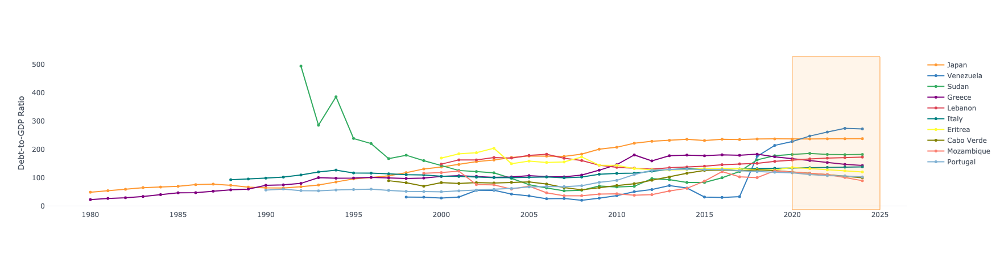

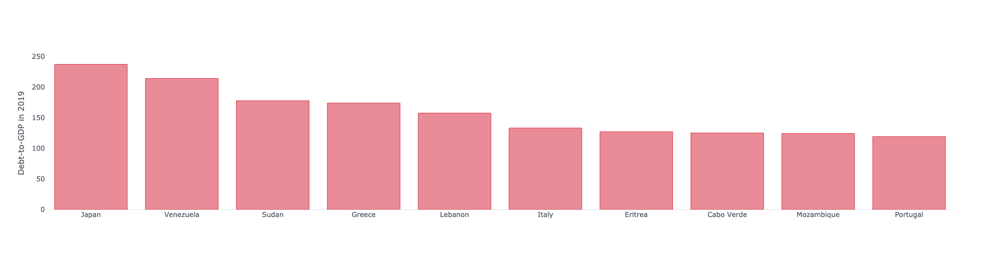

In [5]:
worst = df.set_index('General government gross debt (Percent of GDP)')
worst = worst.sort_values(by='2019', ascending=False)
worst = worst[:18]
worst.T.iplot(mode='lines+markers', size=5, theme='white', yTitle='Debt-to-GDP Ratio', width=2, showgrid=False,
              vspan={'x0':'2020','x1':'2025','color':'orange','fill':True,'opacity':.1})
worst[['2019']].iplot(kind='bar', theme='white', showgrid=False, color='red', yTitle='Debt-to-GDP in 2019')

### Top Performers

- Macao and Hong Kong – both special administrative regions (SARs) in China – have virtually zero debt.
- The official country with the lowest debt is Brunei (2.6%).
- Afghanistan has had an interesting journey, at 346% in 2002, possibly coinciding with the US invasion. The low debt-to-GDP ratio is mostly because of the country's disaster of an economy.
- Notable mentions outside of this spectrum include China (55.4%), which has the second biggest economy in the world but a relatively healthy national balance sheet. Russia (13.8%), a country plagued by corruption and slow growth, is another. 

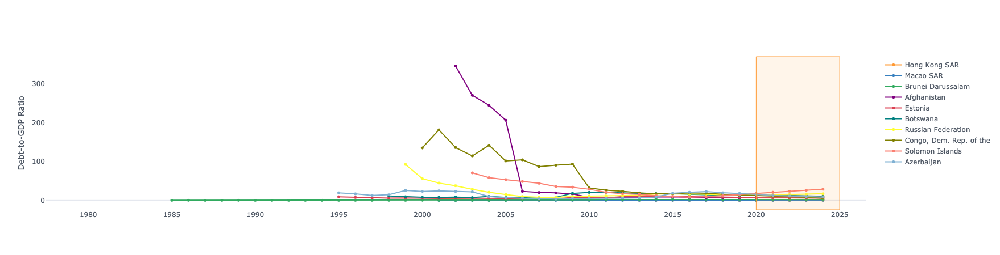

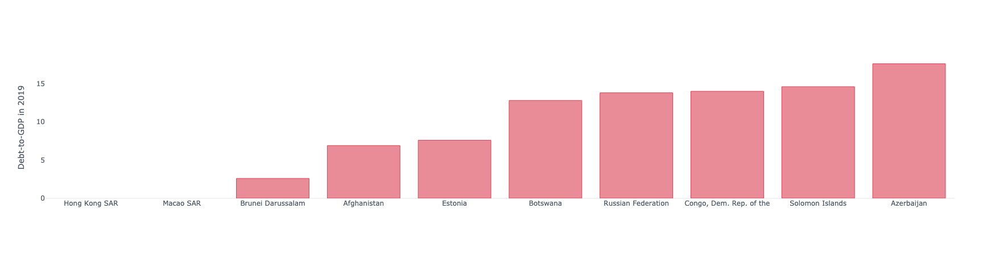

In [250]:
best = df.set_index('General government gross debt (Percent of GDP)')
best = best.sort_values(by='2019', ascending=True)
best = best[:10]
best.T.iplot(mode='lines+markers', size=5, theme='white', yTitle='Debt-to-GDP Ratio', width=2, showgrid=False,
            vspan={'x0':'2020','x1':'2025','color':'orange','fill':True,'opacity':.1})
best[['2019']].iplot(kind='bar', theme='white', showgrid=False, color='red', yTitle='Debt-to-GDP in 2019', margin={'b':100})

### Countries and Regions of Interest

- One can clearly see the impact of the financial crisis on European countries during the 2008-2013 period - Ireland, Spain, Portugal and Greece in particular. 
- Ireland is the top performer in recent years. Most of our debt was accumulated in the economic collapse when the taxpayer bailed out banks and the annual expenditure by Government were exceeding annual revenues.
- Important to note here, despite Greece's dire situation, the IMF has projected a downward trajectory in Greece's Debt-to-GDP (don't know if I trust IMF projections when it comes to Greece at this point though!).
- Both the UK and US exhibit more stable increases over time as their economies have grown.

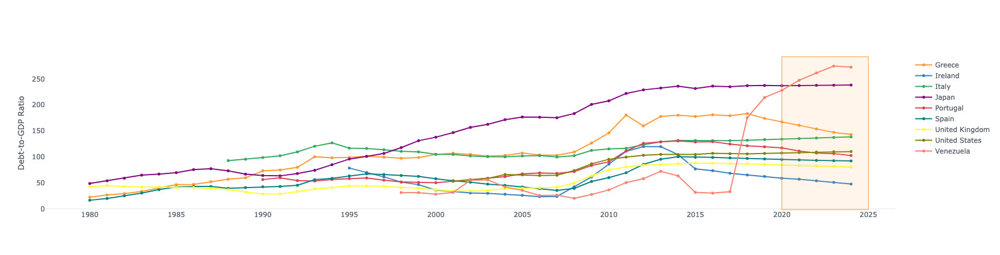

In [245]:
df[df['General government gross debt (Percent of GDP)'].isin(['United States', 'United Kingdom', 'Spain', 'Portugal', 'Japan', 
                           'Venezuela', 'Italy', 'China', 'Greece', 'Ireland'])].set_index('General government gross debt (Percent of GDP)').T.iplot(
    mode='lines+markers', size=5, theme='white', yTitle='Debt-to-GDP Ratio', width=2, showgrid=False,
vspan={'x0':'2020','x1':'2025','color':'orange','fill':True,'opacity':.1})

### Europe

- The Euro Area is performing worse than the rest of Europe debt-wise. Recently, Italy’s economy contracted for a second consecutive quarter, satisfying one of the technical definitions of a recession.
-  Many claim that the area would not have done as badly without the single currency, which prevents countries from devaluing their currency, that could otherwise be used to boost the economy through cheaper exports and reduce the cost of interest payments on its these outstanding government debts.

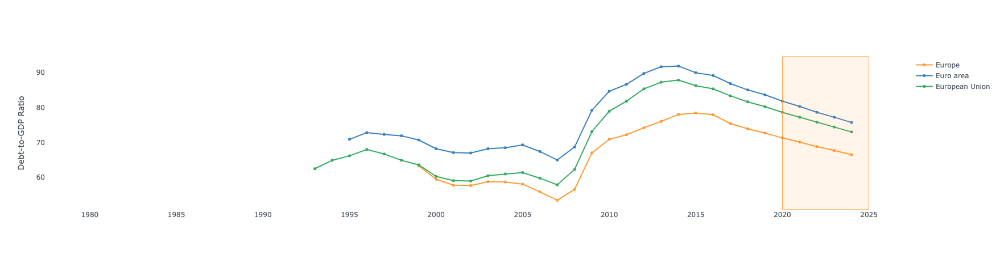

In [241]:
df[df['General government gross debt (Percent of GDP)'].isin(['Europe', 'European Union', 'Euro area'])].set_index('General government gross debt (Percent of GDP)').T.iplot(
    mode='lines+markers', size=5, theme='white', yTitle='Debt-to-GDP Ratio', width=2, showgrid=False,vspan={'x0':'2020','x1':'2025','color':'orange','fill':True,'opacity':.1})

### Middle East | Africa

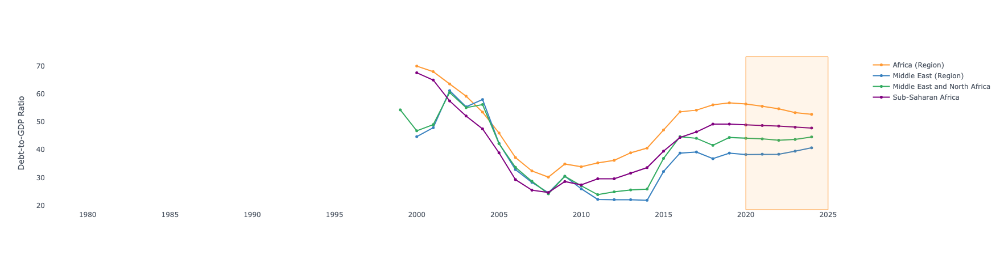

In [242]:
df[df['General government gross debt (Percent of GDP)'].isin(['Sub-Saharan Africa', 'Middle East (Region)', 'Africa (Region)',
                                                             'Middle East and North Africa'])].set_index('General government gross debt (Percent of GDP)').T.iplot(
    mode='lines+markers', size=5, theme='white', yTitle='Debt-to-GDP Ratio', width=2, showgrid=False,
vspan={'x0':'2020','x1':'2025','color':'orange','fill':True,'opacity':.1})

### The Americas

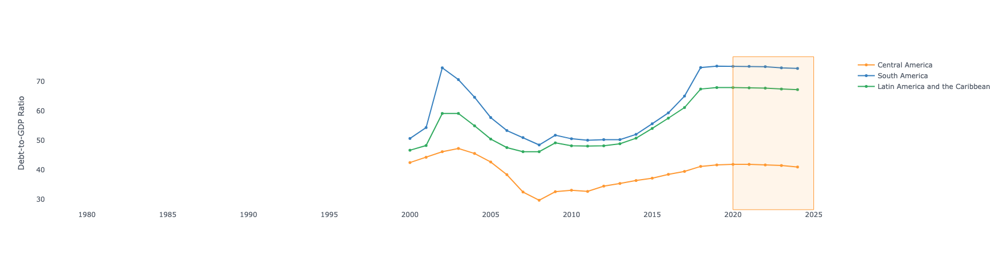

In [246]:
df[df['General government gross debt (Percent of GDP)'].isin(['Latin America and the Caribbean', 'South America', 'Central America'])].set_index('General government gross debt (Percent of GDP)').T.iplot(
    mode='lines+markers', size=5, theme='white', yTitle='Debt-to-GDP Ratio', width=2, showgrid=False,
vspan={'x0':'2020','x1':'2025','color':'orange','fill':True,'opacity':.1})

### Asia

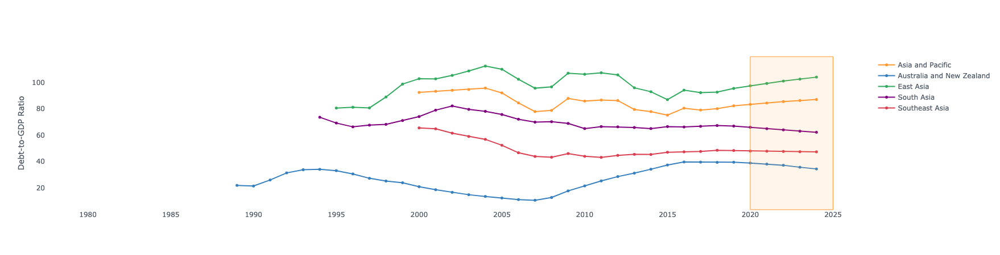

In [243]:
df[df['General government gross debt (Percent of GDP)'].isin(['Asia and Pacific', 'Australia and New Zealand', 'Southeast Asia',
                                                             'South Asia', 'East Asia'])].set_index('General government gross debt (Percent of GDP)').T.iplot(
    mode='lines+markers', size=5, theme='white', yTitle='Debt-to-GDP Ratio', width=2, showgrid=False,
vspan={'x0':'2020','x1':'2025','color':'orange','fill':True,'opacity':.1})

### Grouped Perspective

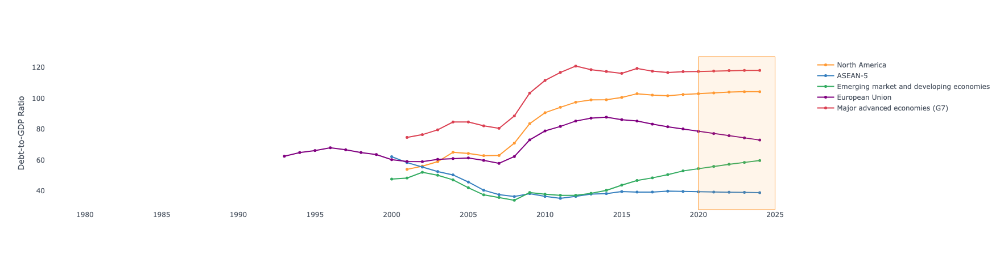

In [244]:
df[df['General government gross debt (Percent of GDP)'].isin(['Major advanced economies (G7)', 'European Union', 'North America',
                                                             'Emerging market and developing economies', 'ASEAN-5'])].set_index('General government gross debt (Percent of GDP)').T.iplot(
    mode='lines+markers', size=5, theme='white', yTitle='Debt-to-GDP Ratio', width=2, showgrid=False,
vspan={'x0':'2020','x1':'2025','color':'orange','fill':True,'opacity':.1})